# Dataset Exploratory Data Analysis

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")

%matplotlib inline

In [2]:
sns.set_style("darkgrid")

# Load Dataset

In [3]:
df = pd.read_csv("data.csv")
df.head()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
0,0.0594,1921,0.982,"['Sergei Rachmaninoff', 'James Levine', 'Berli...",0.279,831667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878000,10,0.665,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954
1,0.9630,1921,0.732,['Dennis Day'],0.819,180533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000000,7,0.160,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936
2,0.0394,1921,0.961,['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...,0.328,500062,0.166,0,1o6I8BglA6ylDMrIELygv1,0.913000,3,0.101,-14.850,1,Gati Bali,5,1921,0.0339,110.339
3,0.1650,1921,0.967,['Frank Parker'],0.275,210000,0.309,0,3ftBPsC5vPBKxYSee08FDH,0.000028,5,0.381,-9.316,1,Danny Boy,3,1921,0.0354,100.109
4,0.2530,1921,0.957,['Phil Regan'],0.418,166693,0.193,0,4d6HGyGT8e121BsdKmw9v6,0.000002,3,0.229,-10.096,1,When Irish Eyes Are Smiling,2,1921,0.0380,101.665


# Data Cleaning

In [4]:
df.isna().sum()

valence             0
year                0
acousticness        0
artists             0
danceability        0
duration_ms         0
energy              0
explicit            0
id                  0
instrumentalness    0
key                 0
liveness            0
loudness            0
mode                0
name                0
popularity          0
release_date        0
speechiness         0
tempo               0
dtype: int64

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  int64  
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  int64  
 16  release_date      17

In [6]:
df.shape

(170653, 19)

In [7]:
df.columns

Index(['valence', 'year', 'acousticness', 'artists', 'danceability',
       'duration_ms', 'energy', 'explicit', 'id', 'instrumentalness', 'key',
       'liveness', 'loudness', 'mode', 'name', 'popularity', 'release_date',
       'speechiness', 'tempo'],
      dtype='object')

In [8]:
len(df.columns)

19

In [9]:
df.describe()

,valence,year,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo
count,170653.000000,170653.000000,170653.000000,170653.000000,1.706530e+05,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000
mean,0.528587,1976.787241,0.502115,0.537396,2.309483e+05,0.482389,0.084575,0.167010,5.199844,0.205839,-11.467990,0.706902,31.431794,0.098393,116.861590
std,0.263171,25.917853,0.376032,0.176138,1.261184e+05,0.267646,0.278249,0.313475,3.515094,0.174805,5.697943,0.455184,21.826615,0.162740,30.708533
min,0.000000,1921.000000,0.000000,0.000000,5.108000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,0.000000,0.000000
25%,0.317000,1956.000000,0.102000,0.415000,1.698270e+05,0.255000,0.000000,0.000000,2.000000,0.098800,-14.615000,0.000000,11.000000,0.034900,93.421000
50%,0.540000,1977.000000,0.516000,0.548000,2.074670e+05,0.471000,0.000000,0.000216,5.000000,0.136000,-10.580000,1.000000,33.000000,0.045000,114.729000
75%,0.747000,1999.000000,0.893000,0.668000,2.624000e+05,0.703000,0.000000,0.102000,8.000000,0.261000,-7.183000,1.000000,48.000000,0.075600,135.537000
max,1.000000,2020.000000,0.996000,0.988000,5.403500e+06,1.000000,1.000000,1.000000,11.000000,1.000000,3.855000,1.000000,100.000000,0.970000,243.507000


In [30]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
valence,170653.0,0.528587,0.263171,0.0,0.3170,0.540000,0.7470,1.000
year,170653.0,1976.787241,25.917853,1921.0,1956.0000,1977.000000,1999.0000,2020.000
acousticness,170653.0,0.502115,0.376032,0.0,0.1020,0.516000,0.8930,0.996
danceability,170653.0,0.537396,0.176138,0.0,0.4150,0.548000,0.6680,0.988
duration_ms,170653.0,230948.310666,126118.414668,5108.0,169827.0000,207467.000000,262400.0000,5403500.000
energy,170653.0,0.482389,0.267646,0.0,0.2550,0.471000,0.7030,1.000
explicit,170653.0,0.084575,0.278249,0.0,0.0000,0.000000,0.0000,1.000
instrumentalness,170653.0,0.167010,0.313475,0.0,0.0000,0.000216,0.1020,1.000
key,170653.0,5.199844,3.515094,0.0,2.0000,5.000000,8.0000,11.000
liveness,170653.0,0.205839,0.174805,0.0,0.0988,0.136000,0.2610,1.000


# Data Analysis

### Top 5 most popular artists

In [21]:
top_five_artists = df.groupby("artists").count().sort_values(by="name", ascending=False)["name"][:5]
top_five_artists

artists
['Эрнест Хемингуэй']     1211
['Эрих Мария Ремарк']    1068
['Francisco Canaro']      942
['Frank Sinatra']         630
['Ignacio Corsini']       628
Name: name, dtype: int64

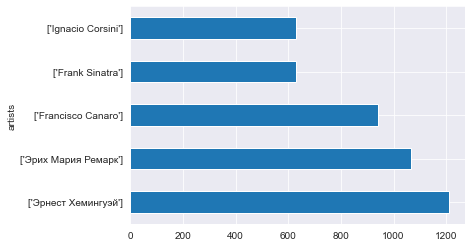

In [22]:
top_five_artists.plot.barh()
plt.show()

### Top 5 loudest tracks

In [23]:
top_five_loudest_tracks = df[["loudness", "name"]].sort_values(by="loudness", ascending=True)[:10]
top_five_loudest_tracks

,loudness,name
22464,-60.0,Pause Track - Live
22399,-60.0,Pause Track - Live
142097,-60.0,Pause Track
128901,-60.0,Hava Nagilah
166250,-60.0,Silent Track
166988,-60.0,Magic Window
152961,-60.0,(silent track)
60974,-60.0,StaggerLee Has His Day at the Beach
78141,-60.0,Pause Track
126511,-55.0,Le sacre du printemps (The Rite of Spring): Pr...


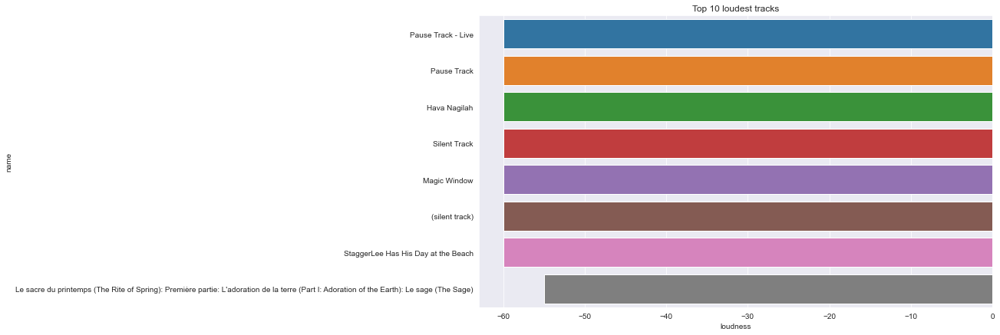

In [24]:
plt.figure(figsize=(12, 7))
sns.barplot(x="loudness", y="name", data=top_five_loudest_tracks)
plt.title("Top 10 loudest tracks")
plt.show()

### Artist with the most danceability songs

In [61]:
top_ten_artists_danceable_song = df[["danceability", "name", "artists"]].sort_values(by="danceability", ascending=False)[:20]
top_ten_artists_danceable_song

,danceability,name,artists
13489,0.988,Funky Cold Medina,['Tone-Loc']
167931,0.986,Go Girl,"['Young Boss', 'Trina', 'Pitbull']"
73561,0.986,Go Girl,"['Pitbull', 'Trina', 'Young Bo']"
170107,0.985,"POP, LOCK & DROPDEAD",['ITSOKTOCRY']
154089,0.983,Monday Nineteen Hours,['Astra Teck']
151032,0.980,Teachers,['Daft Punk']
57388,0.980,Dancing in My Room,['347aidan']
50158,0.980,State of Shock,"['The Jacksons', 'Mick Jagger']"
13655,0.980,Ice Ice Baby,['Vanilla Ice']
37924,0.979,UP LIKE AN INSOMNIAC - Freestyle,['XXXTENTACION']


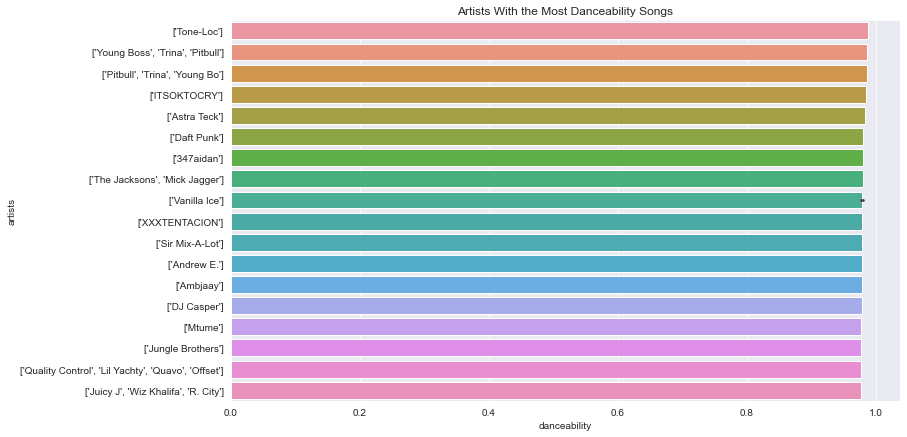

In [62]:
plt.figure(figsize=(12, 7))
sns.barplot(x="danceability", y="artists", data=top_ten_artists_danceable_song)
plt.title("Artists With the Most Danceability Songs")
plt.show()

### Top 10 Instrumentalness tracks

In [27]:
top_ten_instrumental_tracks = df[["instrumentalness", "name", "artists"]].sort_values(by="instrumentalness", ascending=False)[:20]
top_ten_instrumental_tracks

,instrumentalness,name,artists
19260,1.000,Soft Brown Noise,['High Altitude Samples']
138618,1.000,Brown Noise for Sleep,['Sounds for Life']
108109,1.000,White Noise - BP 228 hz,['Granular']
154831,1.000,Pink Noise (Loopable),['Relaxation Channel']
108090,1.000,Rain in the Park,['Rain Sounds ACE']
74372,1.000,White Noise - Loopable With No Fade,"['Erik Eriksson', 'Lullabies for Deep Meditati..."
19030,1.000,Clean White Noise - Loopable with no fade,"['Erik Eriksson', 'White Noise Baby Sleep', 'W..."
56544,1.000,Calm Rain Storm & Gentle White Noise,['The White Noise Zen & Meditation Sound Lab']
56682,1.000,Pure Brown Noise - Loopable with no fade,"['Erik Eriksson', 'White Noise for Babies', 'W..."
56932,1.000,Cabin Back Noise,['High Altitude Samples']


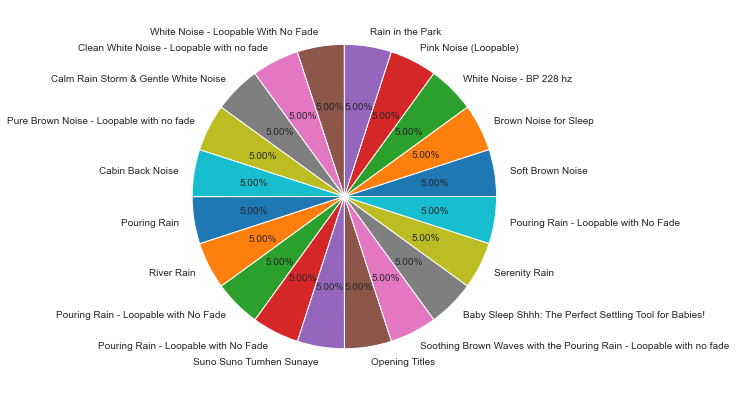

In [28]:
plt.figure(figsize=(12, 7))
plt.pie(x="instrumentalness", data=top_ten_instrumental_tracks, autopct='%1.2f%%', labels=top_ten_instrumental_tracks.name)
plt.show()

### Most Popular Songs

In [69]:
most_popular = df.query('popularity>90', inplace=False).sort_values('popularity', ascending=False)
most_popular[:10]

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,duration
19611,0.1450,2020,0.40100,"['Bad Bunny', 'Jhay Cortez']",0.731,205090,0.573,1,47EiUVwUp4C9fGccaPuUCS,0.000052,4,0.1130,-10.059,0,Dakiti,100,2020-10-30,0.0544,109.928,205
19606,0.7560,2020,0.22100,"['24kGoldn', 'iann dior']",0.700,140526,0.722,1,3tjFYV6RSFtuktYl3ZtYcq,0.000000,7,0.2720,-3.558,0,Mood (feat. iann dior),99,2020-07-24,0.0369,90.989,140
19618,0.7370,2020,0.01120,['BTS'],0.746,199054,0.765,0,0t1kP63rueHleOhQkYSXFY,0.000000,6,0.0936,-4.410,0,Dynamite,97,2020-08-28,0.0993,114.044,199
19608,0.3570,2020,0.01940,"['Cardi B', 'Megan Thee Stallion']",0.935,187541,0.454,1,4Oun2ylbjFKMPTiaSbbCih,0.000000,1,0.0824,-7.509,1,WAP (feat. Megan Thee Stallion),96,2020-08-07,0.3750,133.073,187
19610,0.6820,2020,0.46800,['Ariana Grande'],0.737,172325,0.802,1,35mvY5S1H3J2QZyna3TFe0,0.000000,0,0.0931,-4.771,1,positions,96,2020-10-30,0.0878,144.015,172
19612,0.5430,2020,0.65000,['Pop Smoke'],0.709,160000,0.548,1,1tkg4EHVoqnhR6iFEXb60y,0.000002,10,0.1330,-8.493,1,What You Know Bout Love,96,2020-07-03,0.3530,83.995,160
19616,0.3340,2020,0.00146,['The Weeknd'],0.514,200040,0.730,0,0VjIjW4GlUZAMYd2vXMi3b,0.000095,1,0.0897,-5.934,1,Blinding Lights,96,2020-03-20,0.0598,171.005,200
19620,0.0927,2020,0.86400,"['Justin Bieber', 'benny blanco']",0.631,149297,0.239,1,4y4spB9m0Q6026KfkAvy9Q,0.000000,11,0.1160,-7.071,0,Lonely (with benny blanco),95,2020-10-16,0.0398,79.859,149
19607,0.3470,2020,0.11400,"['Pop Smoke', 'Lil Baby', 'DaBaby']",0.823,190476,0.586,1,0PvFJmanyNQMseIFrU708S,0.000000,6,0.1930,-6.606,0,For The Night (feat. Lil Baby & DaBaby),95,2020-07-03,0.2000,125.971,190
19623,0.0799,2020,0.78600,['Tate McRae'],0.642,169266,0.374,0,45bE4HXI0AwGZXfZtMp8JR,0.000000,4,0.0906,-9.386,1,you broke me first,95,2020-04-17,0.0545,124.099,169


### Correlation Between Variables 

[Text(0.5, 0, 'valence'),
 Text(1.5, 0, 'year'),
 Text(2.5, 0, 'acousticness'),
 Text(3.5, 0, 'danceability'),
 Text(4.5, 0, 'duration_ms'),
 Text(5.5, 0, 'energy'),
 Text(6.5, 0, 'instrumentalness'),
 Text(7.5, 0, 'liveness'),
 Text(8.5, 0, 'loudness'),
 Text(9.5, 0, 'popularity'),
 Text(10.5, 0, 'speechiness'),
 Text(11.5, 0, 'tempo')]

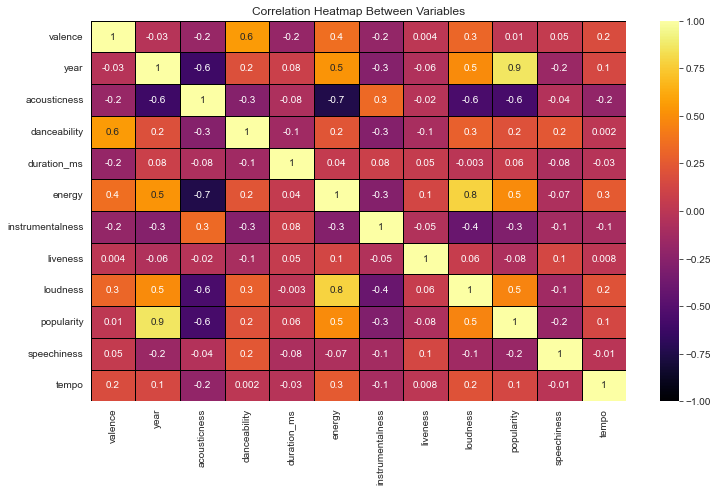

In [32]:
corr_df = df.drop(["key", "mode", "explicit"], axis=1).corr(method="pearson")
plt.figure(figsize=(12, 7))
heatmap=sns.heatmap(corr_df, annot=True, fmt=".1g", vmin=-1, vmax=1, center=0, cmap="inferno", linewidths=1, linecolor="black")
heatmap.set_title("Correlation Heatmap Between Variables")
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=90)

In [34]:
sample_df=df.sample(int(0.004*len(df)))
print(len(sample_df))

682


[Text(0.5, 1.0, 'Loudness vs Energy Correlation')]

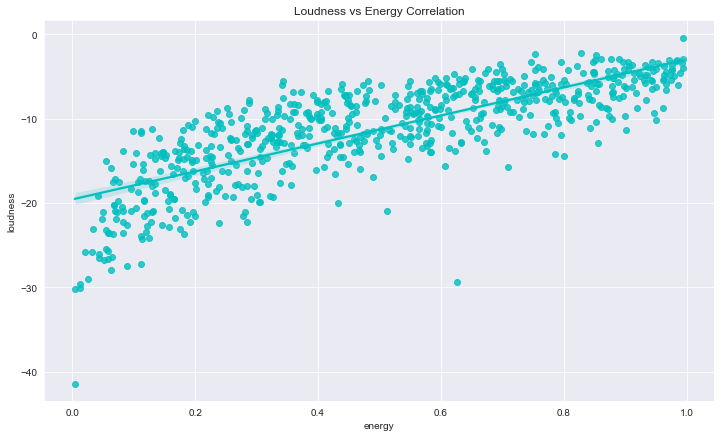

In [37]:
plt.figure(figsize=(12, 7))
sns.regplot(data=sample_df, y="loudness", x="energy", color="c").set(title="Loudness vs Energy Correlation")

[Text(0.5, 1.0, 'Popularity vs Acousticness Correlation')]

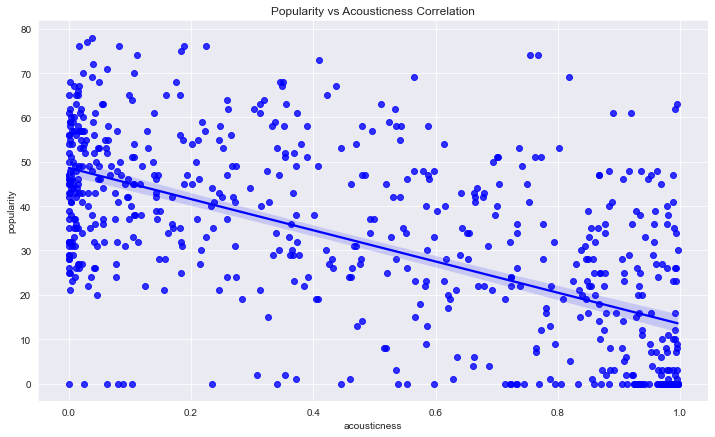

In [38]:
plt.figure(figsize=(12, 7))
sns.regplot(data=sample_df, y="popularity", x="acousticness", color="b").set(title="Popularity vs Acousticness Correlation")

In [66]:
import plotly.express as px
fig2 = px.scatter(df, x="popularity", y="danceability", color="danceability",size='popularity')
fig2.show()

### Multiple feature plots

In [31]:
interest_feature_cols = ["valence", "year", "acousticness", "artists", "danceability", "duration_ms", "energy", "explicit", "instrumentalness", "liveness", "loudness", "name", "popularity", "release_date", "speechiness", "tempo"]

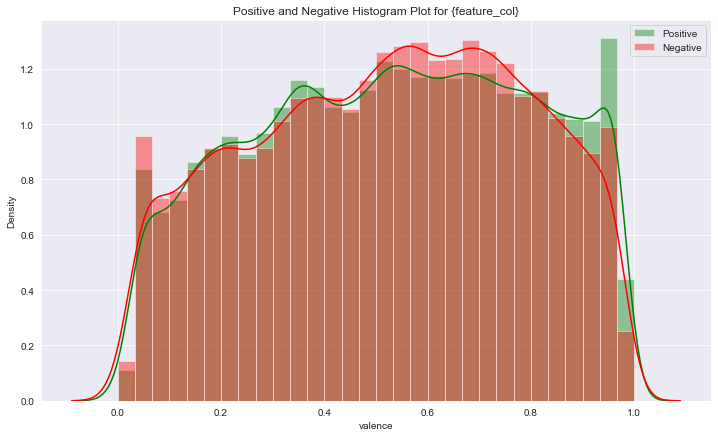

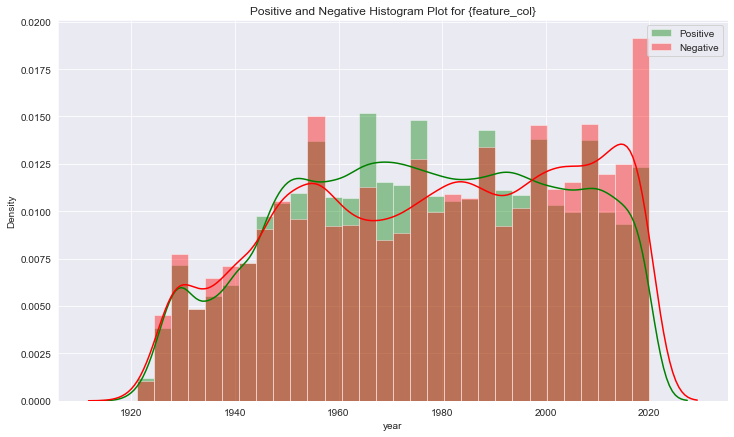

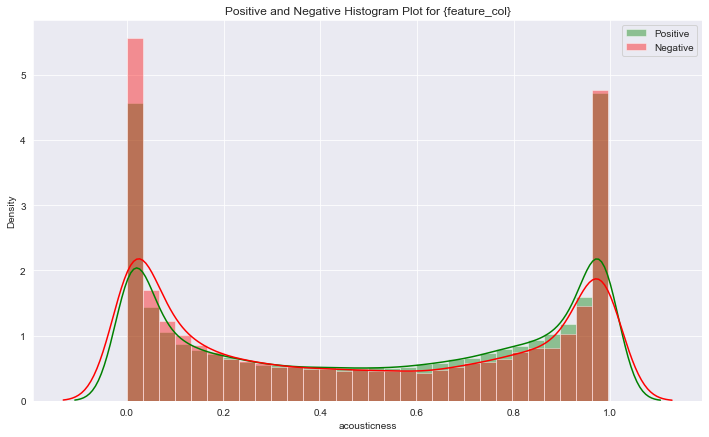

ValueError: could not convert string to float: "['Sergei Rachmaninoff', 'James Levine', 'Berliner Philharmoniker']"

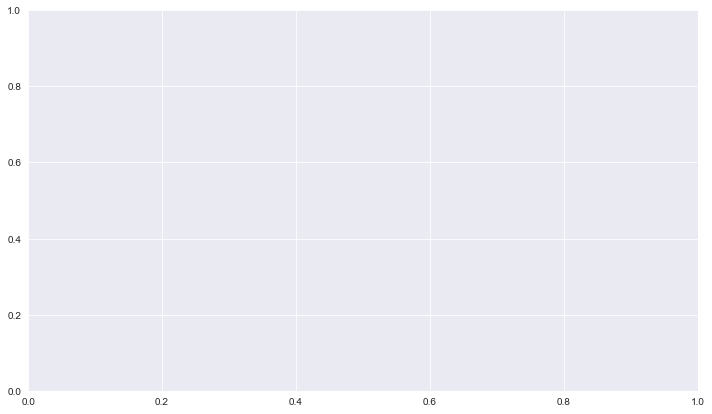

In [72]:
for feature_col in interest_feature_cols:
    pos_data = df[df["mode"] == 1][feature_col]
    neg_data = df[df["mode"] == 0][feature_col]
    
    plt.figure(figsize=(12, 7))
    
    sns.distplot(pos_data, bins=30, label="Positive", color="green")
    sns.distplot(neg_data, bins=30, label="Negative", color="red")
    
    plt.legend(loc="upper right")
    plt.title(f"Positive and Negative Histogram Plot for {feature_col}")
    plt.show()
              

In [68]:
df['duration']=df['duration_ms']//1000
df.drop(['duration_ms'], axis = 1)

,valence,year,acousticness,artists,danceability,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,duration
0,0.0594,1921,0.98200,"['Sergei Rachmaninoff', 'James Levine', 'Berli...",0.279,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878000,10,0.6650,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954,831
1,0.9630,1921,0.73200,['Dennis Day'],0.819,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000000,7,0.1600,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936,180
2,0.0394,1921,0.96100,['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...,0.328,0.166,0,1o6I8BglA6ylDMrIELygv1,0.913000,3,0.1010,-14.850,1,Gati Bali,5,1921,0.0339,110.339,500
3,0.1650,1921,0.96700,['Frank Parker'],0.275,0.309,0,3ftBPsC5vPBKxYSee08FDH,0.000028,5,0.3810,-9.316,1,Danny Boy,3,1921,0.0354,100.109,210
4,0.2530,1921,0.95700,['Phil Regan'],0.418,0.193,0,4d6HGyGT8e121BsdKmw9v6,0.000002,3,0.2290,-10.096,1,When Irish Eyes Are Smiling,2,1921,0.0380,101.665,166
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170648,0.6080,2020,0.08460,"['Anuel AA', 'Daddy Yankee', 'KAROL G', 'Ozuna...",0.786,0.808,0,0KkIkfsLEJbrcIhYsCL7L5,0.000289,7,0.0822,-3.702,1,China,72,2020-05-29,0.0881,105.029,301
170649,0.7340,2020,0.20600,['Ashnikko'],0.717,0.753,0,0OStKKAuXlxA0fMH54Qs6E,0.000000,7,0.1010,-6.020,1,Halloweenie III: Seven Days,68,2020-10-23,0.0605,137.936,150
170650,0.6370,2020,0.10100,['MAMAMOO'],0.634,0.858,0,4BZXVFYCb76Q0Klojq4piV,0.000009,4,0.2580,-2.226,0,AYA,76,2020-11-03,0.0809,91.688,211
170651,0.1950,2020,0.00998,['Eminem'],0.671,0.623,1,5SiZJoLXp3WOl3J4C8IK0d,0.000008,2,0.6430,-7.161,1,Darkness,70,2020-01-17,0.3080,75.055,337
